## Advanced Lane Finding

[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project.  Check out the [writeup template](https://github.com/udacity/CarND-Advanced-Lane-Lines/blob/master/writeup_template.md) for this project and use it as a starting point for creating your own writeup.  


The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
# Import library
import glob

import numpy as np

import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Pipeline

## 1, Compute the camera calibration matrix and distortion coefficients

No points is detected in  camera_cal\calibration1.jpg
No points is detected in  camera_cal\calibration4.jpg
No points is detected in  camera_cal\calibration5.jpg


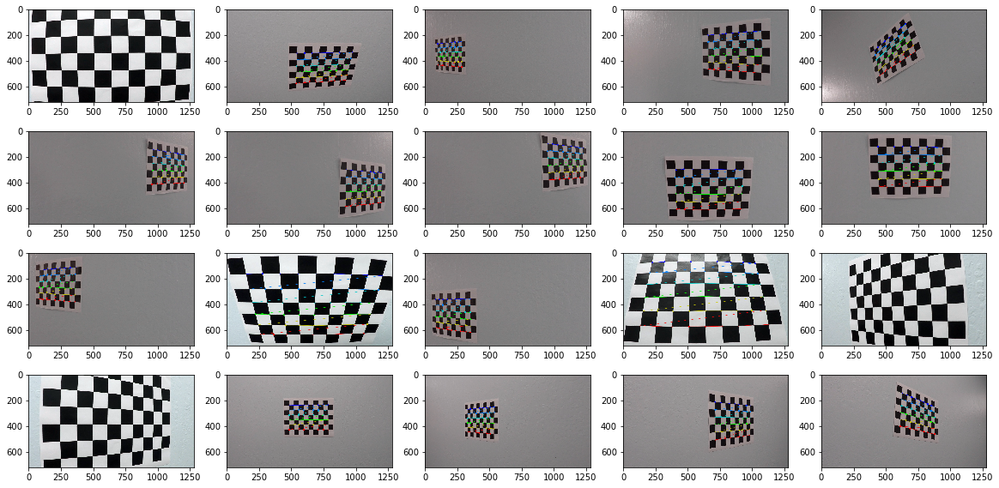

In [2]:
# Finding corners

# Object points information
nx = 9  # row corners
ny = 6  # column corners

# Prepare object points(3D): (0,0,0), (1,0,0)... (since x is column and y is row)
obj_p = np.zeros((ny * nx, 3), np.float32)
# first element = y, second element = x
obj_p[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

# Array to store points
obj_points = []  # 3D points in real world
img_points = []  # 2D points in image plane

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

f, axes = plt.subplots(4, 5, figsize=(20,10))
for idx, file_name in enumerate(images):
    img = cv2.imread(file_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret:
        obj_points.append(obj_p)
        img_points.append(corners)
        
        # Draw found corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    
    else:
        print('No points is detected in ', file_name)
        
    axes[idx//5, idx%5].imshow(img)

In [3]:
# Calculate calibration matrix and distortion coefficient
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img.shape[1::-1], None, None)

## 2, Apply distortion correction

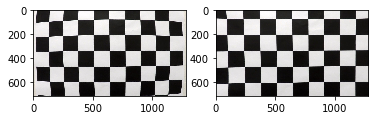

In [4]:
# Apply correction on a checkboard sample
checkboard1 = mpimg.imread('camera_cal/calibration1.jpg')
undist_checkboard1 = cv2.undistort(checkboard1, mtx, dist, None, mtx)
plt.subplot(1,2,1)
plt.imshow(checkboard1)
plt.subplot(1,2,2)
plt.imshow(undist_checkboard1)

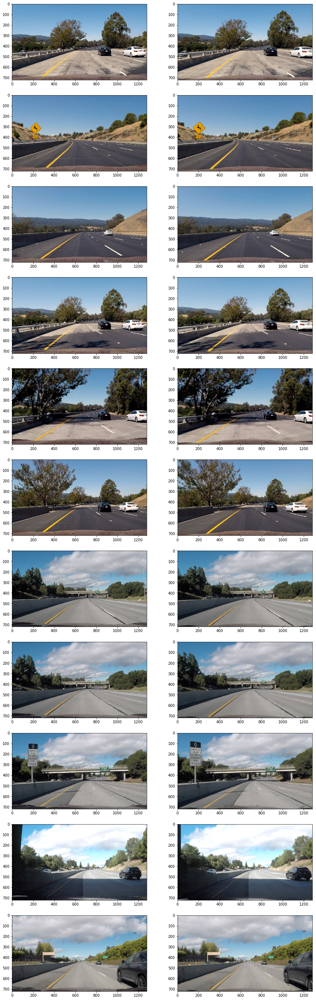

In [5]:
# Apply correction on test images
test_images_list = glob.glob('test_images/test*.jpg')
test_images = [mpimg.imread(test_image) for test_image in test_images_list]
undist_images = [cv2.undistort(image, mtx, dist, None, mtx) for image in test_images]

fig, axes = plt.subplots(len(test_images), 2, figsize=(15, 50))
for idx, test_image in enumerate(test_images):
    image = test_images[idx]
    undist_image = undist_images[idx]
    axes[idx, 0].imshow(image)
    axes[idx, 1].imshow(undist_image)

## 3, Apply a perspective transform.

In [6]:
# Define a function to apply a perspective transform(bird's view)
def perspective_transform(undist_image):
    # Define source and destination point
    x_size = undist_image.shape[1]
    y_size = undist_image.shape[0]
    offset = 200
    src = np.float32(
        [[552, y_size*2/3],
         [738, y_size*2/3],
         [1120, y_size],
         [200, y_size]])
    dst = np.float32(
        [[offset, 0],
         [x_size-offset, 0],
         [x_size-offset, y_size],
         [offset, y_size]])
    
    # Calculate transform matrix and inverse matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp image
    warped = cv2.warpPerspective(undist_image, M, undist_image.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    return warped, Minv

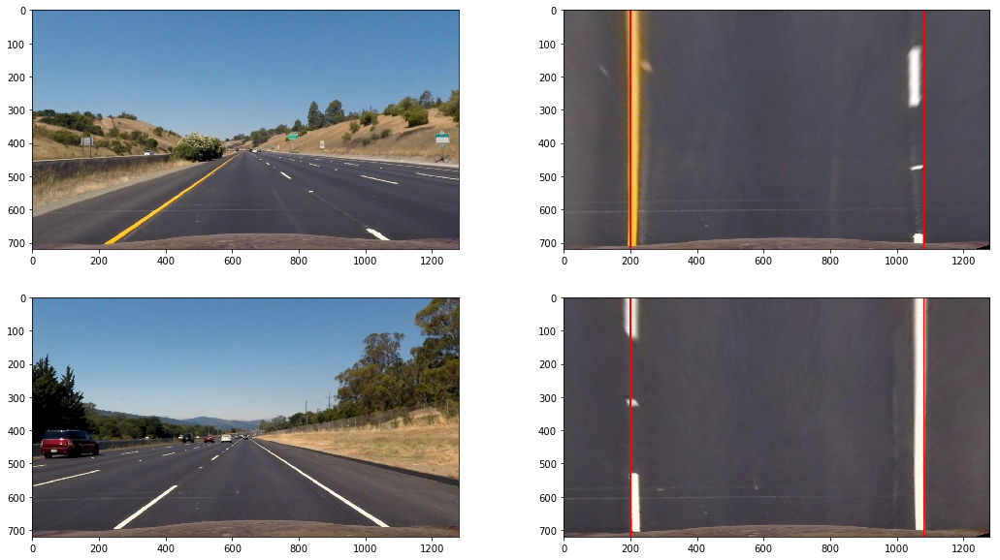

In [7]:
# Test if "src" is reasonable using images with straight line
x_size = undist_image.shape[1]
y_size = undist_image.shape[0]
offset = 200
dst = np.float32(
    [[offset, 0],
     [x_size-offset, 0],
     [x_size-offset, y_size],
     [offset, y_size]])

# Load images with straight lines and apply perspective transform
straight_images_list = glob.glob("test_images/straight_lines*.jpg")
straight_images = [mpimg.imread(straight_image) for straight_image in straight_images_list]
undist_straight_images = [cv2.undistort(image, mtx, dist, None, mtx) for image in straight_images]
warped_straight_images = [perspective_transform(image)[0] for image in undist_straight_images]

# Display
fig, axes = plt.subplots(len(straight_images), 2, figsize=(18, 10))
for idx, test_image in enumerate(straight_images):
    undist_image = undist_straight_images[idx]
    warped_image = warped_straight_images[idx]
    # Draw two straight lines to better demonstrate the results
    warped_image = cv2.line(warped_image, tuple(dst[0]), tuple(dst[3]), [255, 0, 0], 3)
    warped_image = cv2.line(warped_image, tuple(dst[1]), tuple(dst[2]), [255, 0, 0], 3)
    axes[idx, 0].imshow(undist_image)
    axes[idx, 1].imshow(warped_image)

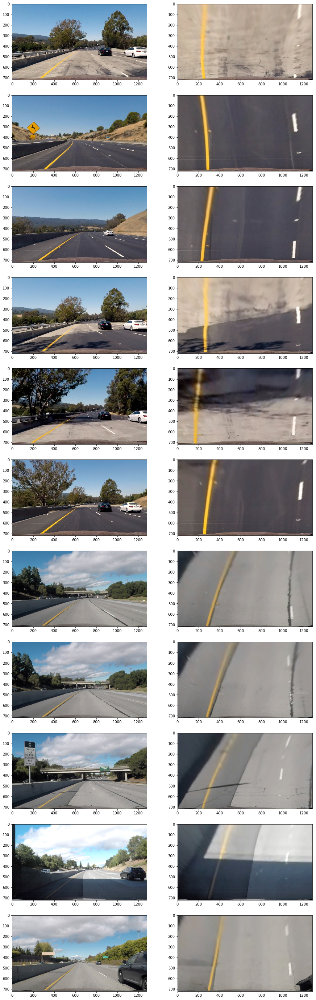

In [8]:
# Apply perspective transform on test images
Minv = perspective_transform(undist_images[0])[1]
warped_images = [perspective_transform(image)[0] for image in undist_images]

fig, axes = plt.subplots(len(undist_images), 2, figsize=(15, 50))
for idx, test_image in enumerate(undist_images):
    undist_image = undist_images[idx]
    warped_image = warped_images[idx]
    axes[idx, 0].imshow(undist_image)
    axes[idx, 1].imshow(warped_image)

## 4, Create a thresholded binary image

In [9]:
# Define a function using Sobel edges detection and HLS information to create a binary image with lanes clearly visiable.
def lane_edge_detection(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Define threshold
    mag_thresh=(7, 255)
    dir_thresh=(0, np.pi/2/90*35)
    s_thresh=(50, 255)
    r_thresh=(190, 255)
    gray_thresh=(232, 255)
    
    # Prepare Sobel and HLS images
    sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3))
    sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3))
    mag = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    dire = np.absolute(np.arctan2(sobel_y, sobel_x))
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:, :, 2]
    r_channel = image[:, :, 0]
    
    # Create a mask
    # ((White & Yellow) & (mag_exclude_weak) & (dir_verticle)) | (White_supplement)
    mask = (((r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1]) |\
             (s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])) &\
            ((mag >= mag_thresh[0]) & (mag <= mag_thresh[1])) &\
            ((dire >= dir_thresh[0]) & (dire <= dir_thresh[1])) |\
           ((gray >= gray_thresh[0]) & (gray <= gray_thresh[1])))
            
    # Prepare an image to binarize
    binary = np.zeros_like(gray)
    binary[mask] = 255
    
    # Return result
    return binary

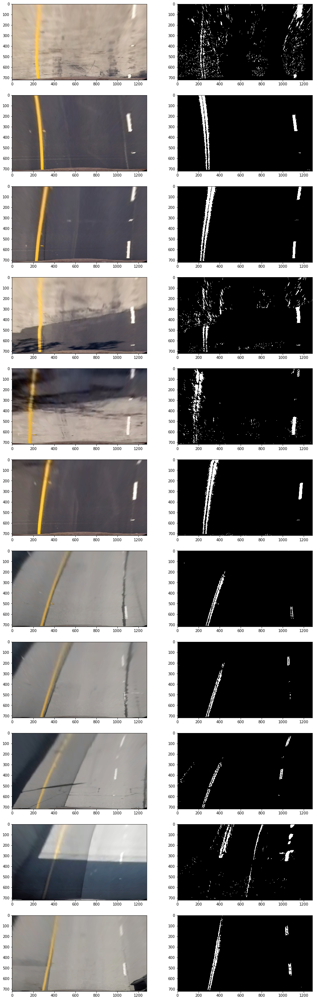

In [10]:
# Apply binarization on test images
binary_images = [lane_edge_detection(image) for image in warped_images]

fig, axes = plt.subplots(len(warped_images), 2, figsize=(15, 50))
for idx, test_image in enumerate(warped_images):
    undist_image = warped_images[idx]
    binary_image = binary_images[idx]
    axes[idx, 0].imshow(undist_image)
    axes[idx, 1].imshow(binary_image, cmap='gray')

## 5, Detect lane boundary and determine the curvature of the lane and vehicle offset.

In [11]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False

        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        # polynomial coefficients for the most recent fit
        self.current_fit = None
        
        # radius of curvature of the line in some units
        self.best_curvature = None
        self.curvature = None
        # distance in meters of vehicle center from the line
        self.best_offset = None
        self.offset = None

        # difference between this line and the new detected line
        self.diff = np.array([0, 0, 0], dtype='float')

In [12]:
# Helper functions to detect lines in an image

# Apply sliding windows technique to fit both lines in a image without prior found lines
def sliding_windows(image):
    # Using histogram to locate appropriate line position
    histogram = np.sum(image, axis=0)
    midpoint = np.int(image.shape[1]//2)
    left_base = np.argmax(histogram[:midpoint-200])
    right_base = np.argmax(histogram[midpoint+200:]) + midpoint+200

    # Set up windows
    no_windows = 9  # number
    margin = 70  # width
    min_pix = 50  # minimum number of pixels
    
    # Candidate pixels
    window_height = np.int(image.shape[0] // no_windows)
    nonzero = image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    # Pointer and contatiner
    left_current = left_base
    right_current = right_base
    left_lane_inds = []
    right_lane_inds = []

    # Track curvature
    for window in range(no_windows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = left_current - margin//2
        win_xleft_high = left_current + margin//2
        win_xright_low = right_current - margin//2
        win_xright_high = right_current + margin//2

        # Indicate pixels in current window
        good_right_inds = ((nonzero_y <= win_y_high) & (nonzero_y >= win_y_low) &
                           (nonzero_x >= win_xright_low) & (nonzero_x <= win_xright_high)).nonzero()[0]
        good_left_inds = ((nonzero_y <= win_y_high) & (nonzero_y >= win_y_low) &
                          (nonzero_x >= win_xleft_low) & (nonzero_x <= win_xleft_high)).nonzero()[0]
        # Update window position
        if len(good_right_inds) > min_pix:
            right_current = np.int(np.mean(nonzero_x[good_right_inds]))
        if len(good_left_inds) > min_pix:
            left_current = np.int(np.mean(nonzero_x[good_left_inds]))
        right_lane_inds.append(good_right_inds)
        left_lane_inds.append(good_left_inds)
        
        #cv2.rectangle(image, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (255, 255, 255), 4)
        #cv2.rectangle(image, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (255, 255, 255), 4)

    # Fit a polynomial
    # Acquire points
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    leftx = nonzero_x[left_lane_inds]
    lefty = nonzero_y[left_lane_inds]
    rightx = nonzero_x[right_lane_inds]
    righty = nonzero_y[right_lane_inds]
    
    left_fit = np.polyfit(lefty, leftx, 1)
    right_fit = np.polyfit(righty, rightx, 1)
    

    return [0, left_fit[0], left_fit[1]], [0, right_fit[0], right_fit[1], 0]


# Fit lines in images with prior detected lines
# Return both fit information in pixel and in meter
def fit_from_prior(image, left_fit, right_fit):
    # Set margin
    margin = 50

    # Grab activated pixels
    nonzero = image.nonzero()
    nonzero_x = nonzero[1]
    nonzero_y = nonzero[0]

    # Set search area
    left_lane_inds = abs((left_fit[0] * nonzero_y**2 + left_fit[1] * nonzero_y + left_fit[2]) - nonzero_x) < margin
    right_lane_inds = abs((right_fit[0] * nonzero_y**2 + right_fit[1] * nonzero_y + right_fit[2]) - nonzero_x) < margin

    # Exact left and right line pixels (in pixel)
    leftx = nonzero_x[left_lane_inds]
    lefty = nonzero_y[left_lane_inds]
    rightx = nonzero_x[right_lane_inds]
    righty = nonzero_y[right_lane_inds]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    # Change from pixels space to meter
    leftx_cr = leftx * xm_per_pix
    lefty_cr = lefty * ym_per_pix
    rightx_cr = rightx * xm_per_pix
    righty_cr = righty * ym_per_pix
    
    return fit_poly(leftx, lefty, rightx, righty), fit_poly(leftx_cr, lefty_cr, rightx_cr, righty_cr)


# Helper function to fit both lines with selected pixels
def fit_poly(leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit


# Calculates the curvature of polynomial functions in meters.
def measure_curvature(image, left_fit_cr, right_fit_cr):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    
    # Image size
    y_eval = image.shape[0]
    
    # Implement the calculation of the left line here
    left_curverad = (1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**(3/2) / (2*abs(left_fit_cr[0]))
    # Implement the calculation of the right line here
    right_curverad = (1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**(3/2) / (2*abs(right_fit_cr[0]))
    
    return left_curverad, right_curverad


# Calculates the offset of polynomial functions in meters.
def measure_offset(image, left_fit, right_fit):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    
    # Image information
    y_eval = image.shape[0]
    mid_point = image.shape[1]//2
    
    # Calculate lines position
    left_fitp = np.dot(left_fit, np.array([y_eval**2, y_eval, 1]))
    right_fitp = np.dot(right_fit, np.array([y_eval**2, y_eval, 1]))
    
    # Calculate offset
    left_offset = (mid_point - left_fitp) * xm_per_pix
    right_offset = (right_fitp - mid_point) * xm_per_pix
    
    return left_offset, right_offset


def check_lines(left_line, right_line):
    # Defina a flag
    are_lines = True

    # Check curvature
    # allowed difference between two curvatures is distant from distance to distance
    # 0~300: 3 times, 300~700: 5 times, 700+: no limit
    if not (0.2 < left_line.curvature/right_line.curvature < 5):
        if left_line.curvature < 700 or right_line.curvature < 700:
            print('curvature error')
            print(left_line.curvature, right_line.curvature)
            are_lines = False
    if not (0.33 < left_line.curvature/right_line.curvature < 3):
        if left_line.curvature < 300 or right_line.curvature < 300:
            print('curvature error')
            print(left_line.curvature, right_line.curvature)
            are_lines = False

    # Check offset
    # Offset should not be too distant from each other since the cat stays in the center
    if abs(left_line.offset - right_line.offset) > 1.2:
        print('offset error')
        print(left_line.offset, right_line.offset)
        are_lines = False

    # All tests pass
    if are_lines:
        # If last lines exist
        if left_line.detected:
            left_line.best_curvature = left_line.curvature
            right_line.best_curvature = right_line.curvature
            left_line.best_offset = left_line.offset
            right_line.best_offset = right_line.offset

            # Smooth the change process
            left_line.best_fit += (left_line.current_fit - left_line.best_fit)/5
            right_line.best_fit += (right_line.current_fit - right_line.best_fit)/5

        # If last lines don't exist
        else:
            left_line.detected = True
            right_line.detected = True
            left_line.best_fit = left_line.current_fit
            right_line.best_fit = right_line.current_fit
            left_line.best_curvature = left_line.curvature
            right_line.best_curvature = right_line.curvature
            left_line.best_offset = left_line.offset
            right_line.best_offset = right_line.offset

In [13]:
# Fit polynomial lines in the image and calculate relevent curvature and offset
def fit_and_cal_curvature_offset(image, left_line, right_line):
    # Load prior fit data, if there isn'y, apply a sliding windows technique
    if not left_line.detected:
        left_fit, right_fit = sliding_windows(image)
    else:
        left_fit, right_fit = left_line.best_fit, right_line.best_fit
   
    # Fit from prior lines to update line information
    [left_line.current_fit, right_line.current_fit], [left_fit_cur, right_fit_cur] = fit_from_prior(image, left_fit, right_fit)
    
    # Calculate curvature and offset of two lines
    left_line.curvature, right_line.curvature = measure_curvature(image, left_fit_cur, right_fit_cur)
    left_line.offset, right_line.offset = measure_offset(image, left_line.current_fit, right_line.current_fit)
    
    # To check if new lines detection are valid, if they are, replace the detection with current one in a smooth process
    check_lines(left_line, right_line)
    
    # If lines are not found yet
    if not left_line.detected:
        image_zero = np.zeros_like(image).astype(np.uint8)
        return np.dstack((image_zero, image_zero, image_zero)), [0, 0], [0, 0]
    
    # Acquire final output of this frame
    left_fit = left_line.best_fit
    right_fit = right_line.best_fit
    curvature = (left_line.best_curvature + right_line.best_curvature) / 2
    offset = (right_line.best_offset - left_line.best_offset) / 2
    
    
    # Visualization
    # Create an image to draw the lines on
    image_zero = np.zeros_like(image).astype(np.uint8)
    lane_image = np.dstack((image_zero, image_zero, image_zero))
    
    # Exact x and y points of two lines
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0], dtype=np.int_)
    left_fitx = np.int_(np.clip(left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2], 0, image.shape[1]-1))
    right_fitx = np.int_(np.clip(right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2], 0, image.shape[1]-1))
    
    # Draw the lane onto the image
    lane_image[ploty, left_fitx, :] = [255, 0, 0]
    lane_image[ploty, right_fitx, :] = [255, 0, 0]
    # Draw the allowed area onto the image
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(lane_image, pts, (0,255, 0))
    
    return lane_image, curvature, offset

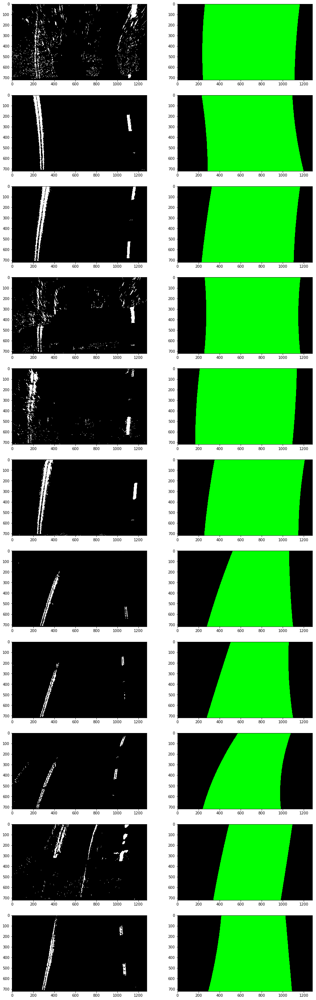

In [14]:
# Apply binarization on test images
lane_images = []
curvatures = []
offsets = []
for image in binary_images:
    left_line = Line()
    right_line = Line()
    lane_image, curvature, offset = fit_and_cal_curvature_offset(image, left_line, right_line)
    lane_images.append(lane_image)
    curvatures.append(curvature)
    offsets.append(offset)

fig, axes = plt.subplots(len(binary_images), 2, figsize=(15, 50))
for idx, test_image in enumerate(binary_images):
    binary_image = binary_images[idx]
    lane_image = lane_images[idx]
    axes[idx, 0].imshow(binary_image, cmap='gray')
    axes[idx, 1].imshow(lane_image)

## 6, Unwarp the detected lane boundaries and output visual display 

In [15]:
# Unwarp the lane image and combine it with original image. Print out relevent lines infomation
def unwarp_found_region(undist_image, lane_image, Minv, curvature, offset):
    # Warp the lane image to original image space using inverse perspective matrix (Minv)
    unwarp_lane = cv2.warpPerspective(lane_image, Minv, (undist_image.shape[1], undist_image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist_image, 1, unwarp_lane, 0.3, 0)
    
    # Print out both lines' curvature and offset
    cur_text = "Radius of Curvature: {}(m)".format(int(curvature))
    if offset > 0:
        offset_text = "Vehicle is {:.2f}m left  of center".format(offset)
    else:
        offset_text = "Vehicle is {:.2f}m right of center".format(-offset)
        
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, cur_text, (300, 70), font, 1.2, (0, 255, 255), 5)
    cv2.putText(result, offset_text, (300, 120), font, 1.2, (0, 255, 255), 5)
    return result

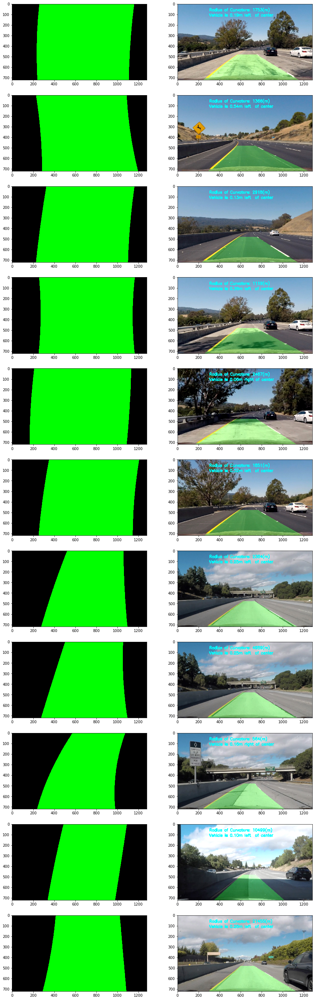

In [16]:
# Apply final step on test images
result_images = []
for idx, lane_image in enumerate(lane_images):
    result_image = unwarp_found_region(undist_images[idx], lane_images[idx], Minv, curvatures[idx], offsets[idx])
    result_images.append(result_image)

fig, axes = plt.subplots(len(lane_images), 2, figsize=(15, 50))
for idx, test_image in enumerate(lane_images):
    lane_image = lane_images[idx]
    result_image = result_images[idx]
    mpimg.imsave("images_output/"+test_images_list[idx].split("\\")[-1], result_image)
    axes[idx, 0].imshow(lane_image)
    axes[idx, 1].imshow(result_image)

# Process videos

In [17]:
# Define process function
def process_image(image):
    # 1,Undistort image
    undist_image = cv2.undistort(image, mtx, dist, None, mtx)

    # 2,Apply Perspective transform
    warped, Minv = perspective_transform(undist_image)

    # 3,Apply Lane edges detection
    binary = lane_edge_detection(warped)
    
    # 4,Fit polynomial equation, calculate curvature and offset
    lane_image, curvature, offset = fit_and_cal_curvature_offset(binary, left_line, right_line)

    # 5,Draw final image
    result = unwarp_found_region(undist_image, lane_image, Minv, curvature, offset)

    return result

In [18]:
left_line = Line()
right_line = Line()
project_output = 'output/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image)
project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video output/project_video.mp4
[MoviePy] Writing video output/project_video.mp4


 48%|█████████████████████████████████████▊                                         | 603/1261 [03:36<03:56,  2.78it/s]

curvature error
686.7660877891262 7466.036880017232


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [04:59<02:38,  2.75it/s]

curvature error
3908.8251920046596 640.2383570390147


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [05:00<02:38,  2.75it/s]

curvature error
10163.45929633651 693.5611037448892


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [05:24<02:13,  2.75it/s]

curvature error
18568.565497709682 545.0013559957529


 71%|████████████████████████████████████████████████████████                       | 894/1261 [05:24<02:13,  2.75it/s]

curvature error
5899.900885208862 516.5670770044801


 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [05:39<01:55,  2.77it/s]

curvature error
5026.352491515137 628.589422268152


 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [05:52<01:42,  2.77it/s]

curvature error
12061.307507354266 626.0494338226406


 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [05:52<01:42,  2.77it/s]

curvature error
34503.29992936924 620.3312236436926


 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [05:54<01:39,  2.77it/s]

curvature error
530.5683039030988 19822.67279090818


 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [05:55<01:39,  2.77it/s]

curvature error
654.3360170391833 19852.40734802537


 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [05:57<01:36,  2.78it/s]

curvature error
3850.565984804178 394.49727004469463


 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [05:58<01:34,  2.78it/s]

curvature error
543.144993278111 2773.3482165047953


 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [06:01<01:31,  2.78it/s]

curvature error
526.3954568787066 4186.504353508653


 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [06:23<01:06,  2.80it/s]

curvature error
10202.078663754335 533.0810003362327


 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [06:24<01:06,  2.80it/s]

curvature error
13405.82496500898 571.9122363190205


 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [06:37<00:50,  2.82it/s]

curvature error
4274.427839988531 661.9072361907033


 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [06:54<00:30,  2.83it/s]

curvature error
3381.8558737363633 601.7189061673165


 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [06:54<00:30,  2.83it/s]

curvature error
3761.060377523914 638.5767546206857


 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [06:54<00:29,  2.83it/s]

curvature error
4169.9204853137435 670.8028477327852


 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [06:55<00:29,  2.83it/s]

curvature error
5867.956754326817 692.1715070828021


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [06:58<00:24,  2.84it/s]

curvature error
3885.924228964155 677.9544690280112


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [07:04<00:18,  2.85it/s]

curvature error
3862.543006420456 672.6801740148311


 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [07:11<00:10,  2.85it/s]

curvature error
8917.594119429454 501.51103510212334


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [07:11<00:10,  2.85it/s]

curvature error
9688.132891255453 544.8921914048717


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [07:12<00:10,  2.85it/s]

curvature error
5334.0372927547305 598.5854668814145


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [07:12<00:09,  2.85it/s]

curvature error
3508.462475369248 584.9932412582775


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [07:12<00:09,  2.85it/s]

curvature error
3634.8895625007185 558.4815938958156


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [07:15<00:07,  2.85it/s]

offset error
1.7745093297983816 2.9828340011203607


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [07:15<00:06,  2.85it/s]

offset error
1.7694340731735587 2.9850063886293245


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [07:18<00:03,  2.85it/s]

offset error
1.7440813472917294 3.004411411794815


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [07:18<00:02,  2.85it/s]

offset error
1.7494073369723757 2.9872029027711475


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:20<00:00,  2.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/project_video.mp4 



In [19]:
HTML("""
<video width="960" height="640" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [20]:
left_line = Line()
right_line = Line()
challenge_output = 'output/challenge_video.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip2.fl_image(process_image)
challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video output/challenge_video.mp4
[MoviePy] Writing video output/challenge_video.mp4


 12%|█████████▌                                                                       | 57/485 [00:18<02:19,  3.07it/s]

curvature error
3743.1362645748973 531.9936782701968


 12%|█████████▋                                                                       | 58/485 [00:18<02:19,  3.07it/s]

curvature error
214076.6342017155 525.568973315011


 15%|███████████▊                                                                     | 71/485 [00:22<02:12,  3.11it/s]

curvature error
3214.6205834668554 467.54770341729335


 15%|████████████▏                                                                    | 73/485 [00:23<02:12,  3.11it/s]

curvature error
3919.0393931874255 516.4101555658877


 15%|████████████▎                                                                    | 74/485 [00:23<02:12,  3.11it/s]

curvature error
5213.096299184628 421.93499748014324


 15%|████████████▌                                                                    | 75/485 [00:24<02:12,  3.11it/s]

curvature error
5384.826291266588 483.26086435129935


 16%|████████████▊                                                                    | 77/485 [00:25<02:12,  3.08it/s]

curvature error
5518.457685138908 647.033988611709


 20%|████████████████                                                                 | 96/485 [00:30<02:04,  3.11it/s]

curvature error
3515.2954755072587 534.7443612703603


 20%|████████████████▏                                                                | 97/485 [00:31<02:04,  3.11it/s]

curvature error
6197.801487908703 525.734950267013


 24%|███████████████████▎                                                            | 117/485 [00:37<01:57,  3.14it/s]

curvature error
5439.908187758893 646.2055339370867


 24%|███████████████████▍                                                            | 118/485 [00:37<01:56,  3.14it/s]

curvature error
17030.19879794553 575.9296204447387


 25%|███████████████████▋                                                            | 119/485 [00:37<01:56,  3.13it/s]

curvature error
8354.167534462444 543.1886554215135


 25%|███████████████████▊                                                            | 120/485 [00:38<01:56,  3.13it/s]

curvature error
15457.811839234373 560.7205023559997


 25%|███████████████████▉                                                            | 121/485 [00:38<01:56,  3.12it/s]

curvature error
5104.4348853932715 604.6941641624201


 27%|█████████████████████▍                                                          | 130/485 [00:41<01:53,  3.12it/s]

curvature error
618.5860441056242 152.09429841731793


 31%|████████████████████████▋                                                       | 150/485 [00:47<01:47,  3.13it/s]

curvature error
3490.532794087603 591.666823394038


 31%|████████████████████████▉                                                       | 151/485 [00:48<01:46,  3.13it/s]

curvature error
3655.4005883439027 580.0447712254668


 32%|█████████████████████████▉                                                      | 157/485 [00:50<01:45,  3.11it/s]

curvature error
3622.412872810268 602.6658279334177


 99%|███████████████████████████████████████████████████████████████████████████████▎| 481/485 [02:27<00:01,  3.25it/s]

curvature error
3537.1895846157554 537.7031057071829


100%|███████████████████████████████████████████████████████████████████████████████▋| 483/485 [02:28<00:00,  3.25it/s]

curvature error
3236.7994403687176 631.5960249715982


100%|███████████████████████████████████████████████████████████████████████████████▊| 484/485 [02:28<00:00,  3.25it/s]

curvature error
3236.7994403687176 631.5960249715982


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [02:29<00:00,  3.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/challenge_video.mp4 



In [21]:
HTML("""
<video width="960" height="640" controls>
  <source src="{0}">
</video>
""".format(challenge_output))